### Importing Python Libraries

In [1]:
import numpy as np
import pandas as pd
import altair as alt
import re
import matplotlib.pyplot as plt
%matplotlib inline
from wordcloud import WordCloud, STOPWORDS
stopwords = set(STOPWORDS)
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import linear_kernel

In [2]:
df = pd.read_csv('C:/Users/Dell/Desktop/PROJECT/Bollywood Movie Recommendation/bollywood_full.csv')

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4329 entries, 0 to 4328
Data columns (total 18 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   title_x           4329 non-null   object 
 1   imdb_id           4329 non-null   object 
 2   poster_path       3579 non-null   object 
 3   wiki_link         4329 non-null   object 
 4   title_y           4329 non-null   object 
 5   original_title    4329 non-null   object 
 6   is_adult          4329 non-null   int64  
 7   year_of_release   4329 non-null   int64  
 8   runtime           4329 non-null   object 
 9   genres            4329 non-null   object 
 10  imdb_rating       4329 non-null   float64
 11  imdb_votes        4329 non-null   int64  
 12  story             4065 non-null   object 
 13  summary           4329 non-null   object 
 14  tagline           685 non-null    object 
 15  actors            4320 non-null   object 
 16  wins_nominations  1344 non-null   object 


In [5]:
df.head(6)

,title_x,imdb_id,poster_path,wiki_link,title_y,original_title,is_adult,year_of_release,runtime,genres,imdb_rating,imdb_votes,story,summary,tagline,actors,wins_nominations,release_date
0,Uri: The Surgical Strike,tt8291224,https://upload.wikimedia.org/wikipedia/en/thum...,https://en.wikipedia.org/wiki/Uri:_The_Surgica...,Uri: The Surgical Strike,Uri: The Surgical Strike,0,2019,138,Action|Drama|War,8.4,35112,Divided over five chapters the film chronicle...,Indian army special forces execute a covert op...,NaN,Vicky Kaushal|Paresh Rawal|Mohit Raina|Yami Ga...,4 wins,11 January 2019 (USA)
1,Battalion 609,tt9472208,NaN,https://en.wikipedia.org/wiki/Battalion_609,Battalion 609,Battalion 609,0,2019,131,War,4.1,73,The story revolves around a cricket match betw...,The story of Battalion 609 revolves around a c...,NaN,Vicky Ahuja|Shoaib Ibrahim|Shrikant Kamat|Elen...,NaN,11 January 2019 (India)
2,The Accidental Prime Minister (film),tt6986710,https://upload.wikimedia.org/wikipedia/en/thum...,https://en.wikipedia.org/wiki/The_Accidental_P...,The Accidental Prime Minister,The Accidental Prime Minister,0,2019,112,Biography|Drama,6.1,5549,Based on the memoir by Indian policy analyst S...,Explores Manmohan Singh's tenure as the Prime ...,NaN,Anupam Kher|Akshaye Khanna|Aahana Kumra|Atul S...,NaN,11 January 2019 (USA)
3,Why Cheat India,tt8108208,https://upload.wikimedia.org/wikipedia/en/thum...,https://en.wikipedia.org/wiki/Why_Cheat_India,Why Cheat India,Why Cheat India,0,2019,121,Crime|Drama,6.0,1891,The movie focuses on existing malpractices in ...,The movie focuses on existing malpractices in ...,NaN,Emraan Hashmi|Shreya Dhanwanthary|Snighdadeep ...,NaN,18 January 2019 (USA)
4,Evening Shadows,tt6028796,NaN,https://en.wikipedia.org/wiki/Evening_Shadows,Evening Shadows,Evening Shadows,0,2018,102,Drama,7.3,280,While gay rights and marriage equality has bee...,Under the 'Evening Shadows' truth often plays...,NaN,Mona Ambegaonkar|Ananth Narayan Mahadevan|Deva...,17 wins & 1 nomination,11 January 2019 (India)
5,Soni (film),tt6078866,https://upload.wikimedia.org/wikipedia/en/thum...,https://en.wikipedia.org/wiki/Soni_(film),Soni,Soni,0,2018,97,Drama,7.2,1595,Soni a young policewoman in Delhi and her su...,While fighting crimes against women in Delhi ...,NaN,Geetika Vidya Ohlyan|Saloni Batra|Vikas Shukla...,3 wins & 5 nominations,18 January 2019 (USA)


In [9]:
df.tail(6)

,title_x,imdb_id,poster_path,wiki_link,title_y,original_title,is_adult,year_of_release,runtime,genres,imdb_rating,imdb_votes,story,summary,tagline,actors,wins_nominations,release_date
4323,Jogan (film),tt0141441,https://upload.wikimedia.org/wikipedia/en/c/cc...,https://en.wikipedia.org/wiki/Jogan_(film),Jogan,Jogan,0,1950,116,Drama|Musical|Romance,7.3,59,Orphaned at a young age Vijay lives with his ...,An atheist falls in love with a married devout...,NaN,Nargis|Dilip Kumar|Pratima Devi|Purnima|Tabass...,NaN,NaN
4324,Samadhi (1950 film),tt0268614,https://upload.wikimedia.org/wikipedia/en/thum...,https://en.wikipedia.org/wiki/Samadhi_(1950_film),Samadhi,Samadhi,0,1950,165,Drama,6.1,21,The story is based on the true incident at INA...,The story is based on the true incident at INA...,NaN,Ashok Kumar|Nalini Jaywant|Kuldip Kaur|Shyam|M...,NaN,NaN
4325,Sangram (1950 film),tt0244182,https://upload.wikimedia.org/wikipedia/en/thum...,https://en.wikipedia.org/wiki/Sangram_(1950_film),Sangram,Sangram,0,1950,139,Drama,6.2,20,After the death of his wife a policeman fails...,After the death of his wife a policeman fails...,NaN,Ashok Kumar|Nalini Jaywant|Nawab|Sajjan|Tiwari...,NaN,NaN
4326,Sargam (1950 film),tt0269826,NaN,https://en.wikipedia.org/wiki/Sargam_(1950_film),Melody,Sargam,0,1950,135,Drama|Family,6.8,21,NaN,Add a Plot »,NaN,Raj Kapoor|Rehana|Om Prakash|David Abraham|Rad...,NaN,4 February 1957 (Iran)
4327,Sheesh Mahal (1950 film),tt0243555,https://upload.wikimedia.org/wikipedia/en/thum...,https://en.wikipedia.org/wiki/Sheesh_Mahal_(19...,Sheesh Mahal,Sheesh Mahal,0,1950,144,Drama,7.0,13,Thakur Jaspal Singh lives in the prestigious a...,Thakur Jaspal Singh lives in the prestigious a...,NaN,Sohrab Modi|Naseem Banu|Pushpa Hans|Nigar Sult...,NaN,NaN
4328,Meena Bazaar (film),tt0213081,NaN,https://en.wikipedia.org/wiki/Meena_Bazaar_(19...,Meena Bazaar,Meena Bazaar,0,1950,\N,Drama,7.0,9,NaN,Add a Plot »,NaN,NaN,NaN,NaN


## DataSet Exploration

The Dataset has some columns which might not be useful for analysis. Let's drop them to have only significant data part.

In [10]:
# Droping columns which will not be used for analysis
df = df.drop(['title_y', 'imdb_id', 'poster_path', 'wiki_link', 'tagline', 'release_date'], axis=1)

### Renaming for ease of reference

In [11]:
df = df.rename(columns={'original_title': 'title', 'year_of_release':'year', 'imdb_rating':'rating', 'imdb_votes':'votes', 'wins_nominations':'awards'})

## Cleaning Process

Awards columns has both awards and nominations. Separation is required for better understanding so separating them into wins and nominations. 

In [12]:
# Data cleaning
df['awards'] = df['awards'].apply(lambda x: re.sub(r'[A-Za-z]', '', str(x)))
df[['wins', 'nominations']] = df.awards.str.split('&', expand=True)
df['wins'] = df['wins'].str.strip()
df['wins'] = df['wins'].apply(lambda x: 0 if x=='' else x)
df['wins'] = df['wins'].replace(np.nan, 0)
df['wins'] = df['wins'].astype(int)

Actors column has list of all the actors from the movie. 
Let's first explore dataset in regards to lead actor , hence we need only the First Actor.

In [13]:
actors = df.actors.str.split('|', expand=True)
df['lead_actor'] = actors[0]


Genres columns has many genres pipe seperated to which movie might belong.
Let's consider first genre which will describe movie as main genre and then discard rest of them.
Also Droping duplicates from the dataset

In [14]:
df[['genre','genre2', 'genre3']] = df.genres.str.split("|",expand=True)
df = df.drop(['genres', 'awards', 'actors', 'genre2', 'genre3', 'nominations'], axis=1)

df = df.drop_duplicates()

### Let’s look at the movies released in each year

In [22]:
alt.Chart(df, title='Bollywood movies released over the years').mark_circle(opacity=0.8).transform_window(
    id='rank()',
    groupby=['year']
).encode(
    alt.X('year', scale=alt.Scale(type='linear', domain=[1950, 2020])),
    alt.Y('id:O', axis=None, sort='descending'),
    tooltip=['title', 'year', 'rating'],
    color='genre'
).properties(height=500, width=800)

alt.Chart(...)

##  ;)    Drama has Always dominated bollywood.

### Action movies have gained momentum since 1980 and Comedy from early 2000. 

## Thrillers are in vogue right now.

===================================================================================================================== 

 Let’s look at how many movies of each genre were made each year

In [19]:
temp1 = df.groupby(['genre', 'year']).size().reset_index(name='count')
alt.Chart(temp1, title='Bollywood movies genre over the years').mark_bar(opacity=0.9).encode(
    alt.X('year', scale=alt.Scale(type='linear', domain=[1955, 2015])),
    alt.Y('count', stack='zero'),
    color='genre',
    tooltip=['genre', 'year']
).properties(height=500, width=800)

alt.Chart(...)

- Till 1970s drama dominated bollywood. But, after that action movies started gaining momentum,Amitabh Bachchan may be the reason we will find soon ;) . 

- Looks like 80s till 2000 was action era of bollywood.Ofcourse, Actors such as Akshay kumar, Ajay devgan, Sunil shetty, Sunny deol, Sanjay dutt were dominating the bollywood scene that time with lots of action on the big screen. 

- From early 2000 comedy movies started gaining catching up to drama and action. From 2000 till 2010 some of the best comedy movies were made like hera pheri one of my favourites. 

- Romantic movies count have been low compared to drama, action or comedy also for few brief period hardly any romantic movies were made. Romantic movie although low in count have been big success in bollywood.

### Let’s explore the movies that won awards in bollywood

In [27]:
winners = df[df['wins']!=0]
alt.Chart(winners, title='Award winning movies over the years').mark_circle(opacity=0.8).transform_window(
    id='rank()',
    groupby=['year']
).encode(
    alt.X('year', scale=alt.Scale(type='linear', domain=[1950, 2020])),
    alt.Y('id:O', axis=None, sort='descending'),
    tooltip=['title', 'lead_actor'],
    color='genre'
).properties(height=500, width=800)

alt.Chart(...)

- Wow, Drama movies dominated the award scene till late 80s. But, since 1990s we are seeing healthy mix of genre in awards.

- But, we can clearly see that bollywood has started giving toooo many awards since 2000. Which I Think is because of diverse audience and more no of movies and even more no of different Award Shows.

### I always wonder Does movie that win multiple records also have high ratings? Lets end the curiousity

Checking for movies that have won more than 5 awards

In [29]:
alt.Chart(winners[winners['wins']>5], title='Multiple award winning movies over the years').mark_circle(opacity=0.8).transform_window(
    id='rank()',
    groupby=['year']
).encode(
    alt.X('year', scale=alt.Scale(type='linear', domain=[1950, 2020])),
    alt.Y('rating', scale=alt.Scale(type='linear', domain=[0, 10])),
    tooltip=['title', 'year'],
    color='genre'
).properties(height=500, width=800)

alt.Chart(...)

Ohkkkk ! It's a thing.

But, What about votes? Does the movie that have higher rating also have most votes?

### Movies which won more than 5 awards with their rating and votes

In [35]:
alt.Chart(winners[winners['wins']>=5], title='Movies that won more than 5 award with its rating and votes').mark_circle(opacity=0.8).transform_window(
    id='rank()',
    groupby=['year']
).encode(
    alt.X('year', scale=alt.Scale(type='linear', domain=[1950, 2020])),
    alt.Y('votes', scale=alt.Scale(type='log', domain=[10, 1000000])),
    tooltip=['title', 'votes' , 'rating'],
    color='genre'
).properties(height=600, width=700)

alt.Chart(...)

It seems that lot of movies from early bollywood era haven’t been rate by many user. Handful of bollywood movies have more than 100000 ratings.

3 idios outclassing every other movie with whopping 300K votes.

### Who is the actor with multiple appeearence in award winning movies? Ahhha this is a great ques always.

We will find out lead actors who appeared in award winning movies.

In [37]:
temp2 = winners.lead_actor.value_counts().head(10).rename_axis('actor').reset_index(name='appearences')
alt.Chart(temp2, title='Lead actor with most appearnces in award winning movies').mark_bar().encode(
    alt.X('actor', axis=alt.Axis(labelAngle=-45)),
    alt.Y("appearences")
).properties(width=800)

alt.Chart(...)

Great, Big B, Shri Amitabh Bachchan would have been obvious choice considering Big B’s career span over five decades.Rajesh Khanna is second with 40 award winning movies in short career span. For a brief period in bollywood Rajesh Khanna was surely the biggest star. 
king khan is fourth right after Ajay devgan in giving award winning movies.

### Let's look at the award winning movies of leading bollywood actors across time and see how they were rate by public.

In [38]:
temp3 = winners[winners['lead_actor'].isin(temp2.actor.tolist())]
alt.Chart(temp3, title='Award winning Movies of Top actors').mark_circle(opacity=0.8).transform_window(
    id='rank()',
    groupby=['year']
).encode(
    alt.X('year', scale=alt.Scale(type='linear', domain=[1950, 2020])),
    alt.Y('rating', scale=alt.Scale(type='linear', domain=[0, 10])),
    tooltip=['title', 'year', 'rating','genre'],
    color='lead_actor'
).properties(height=600, width=800)

alt.Chart(...)

Interesting! Lot of bad movies have started winning awards in hollywood in recent years. Going as low as humshakals and himmatwala each of which have close to two rating and still won awards.

### Who is the most successful actor in bollywood?

Calculating percentage of award winning movies from total movies done by leaading bollywood actors

In [40]:
movies_done_by_top_actors = df[df['lead_actor'].isin(temp3.lead_actor.tolist())]
success_percentage = (temp3.lead_actor.value_counts() / movies_done_by_top_actors.lead_actor.value_counts() * 100).rename_axis('actor').reset_index(name='% success')
alt.Chart(success_percentage, title='Success percentage of top actors').mark_bar().encode(
    alt.X('actor', axis=alt.Axis(labelAngle=-45)),
    alt.Y("% success")
).properties(width=600)

alt.Chart(...)

Expected. Shah Rukh Khan is known as king khan for a reason with highest 80% success rate.

### Does movie length impact its rating?
Is there a sweet spot of movie runtime that impact the ratings. Do the directors know that?

In [42]:
alt.Chart(df, title='How rating varies with runtime').mark_circle().encode(
    alt.X('runtime', bin=alt.Bin(maxbins=20), scale=alt.Scale(type='linear', domain=[60, 220])),
    alt.Y('rating', bin=alt.Bin(maxbins=10)),
    size='count()'
).properties(height=300, width=800)

alt.Chart(...)

It seems bollywood has consensus on movie length. Most of the movie falls between 120-140 mins.

### Highest rated bollywood movies since 1950 till 2019?


In [43]:
temp5 = df.groupby(['year'])[['title','genre', 'rating']].max().reset_index()
alt.Chart(temp5, title='Highest rates movies of all years').mark_circle(opacity=0.8).transform_window(
    id='rank()',
    groupby=['year']
).encode(
    alt.X('year', scale=alt.Scale(type='linear', domain=[1950, 2020])),
    alt.Y('rating', scale=alt.Scale(type='linear', domain=[0, 10])),
    tooltip=['title', 'year', 'rating','genre'],
    color='genre'
).properties(height=200, width=800)

alt.Chart(...)

Wow, Although Drama dominated movies in till 1980 but highest rated movies are "ROMANTIC" for those years. I guess some really good romantic gems are hidden there. Also, action dominated bollywood since 1990s but ratings show that people love dramas more now.

### Does Movie genre and word cloud of summary have some realation?


Action


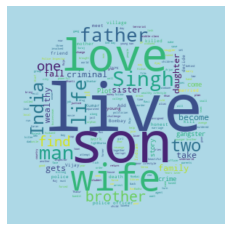

Adventure


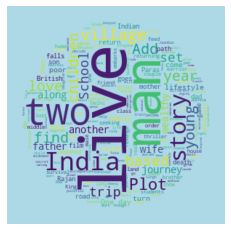

Animation


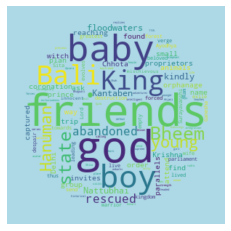

Biography


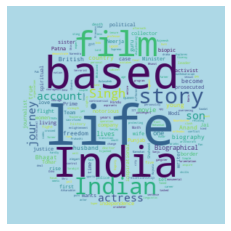

Comedy


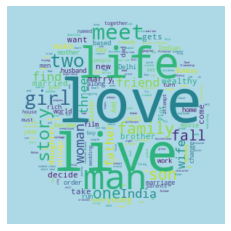

Crime


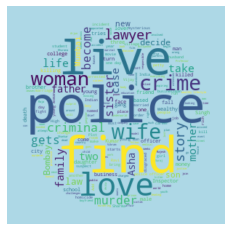

Documentary


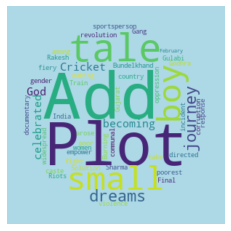

Drama


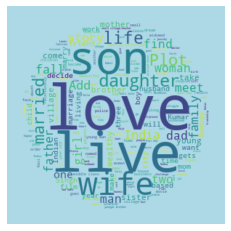

Family


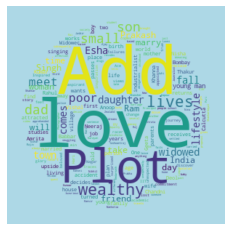

Fantasy


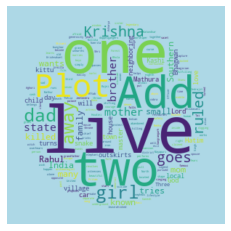

History


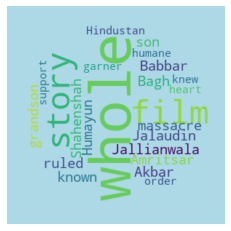

Horror


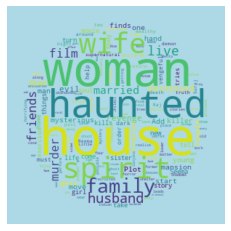

Music


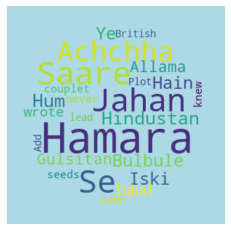

Musical


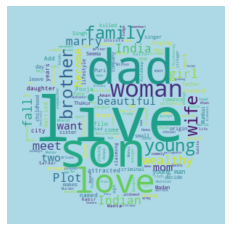

Mystery


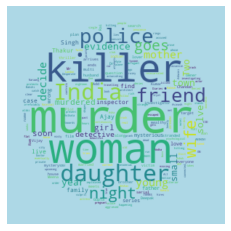

Romance


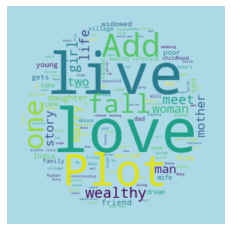

Sci-Fi


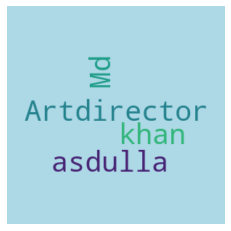

Sport


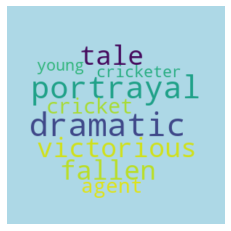

Thriller


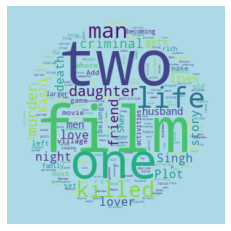

War


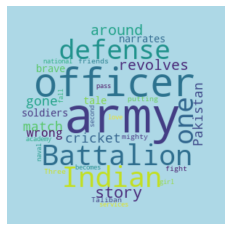

In [53]:
temp6 = df.groupby(['genre'])['summary']

x, y = np.ogrid[:300, :300]

mask = (x - 150) ** 2 + (y - 150) ** 2 > 130 ** 2
mask = 255 * mask.astype(int)

for name, group in temp6:
    text = ' '.join(group.tolist())
    wordcloud = WordCloud(width=500, height=500, margin=0,background_color ='lightblue' ,
                          stopwords = stopwords, mask=mask)
    wordcloud = wordcloud.generate(text)
    print(name)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()

## Looks like movie summary are good descriptiors of type of genre.

Would Explore the Dataset more and add the results ...